<a href="https://colab.research.google.com/github/angli66/3D-reconstruction-demo/blob/main/results.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Approach

The idea of this approach is mostly based on SFM (Structure from Motion) algorithm. Given 49 in-order images (in-order means every two neighboring images is photoed by neighboring cameras), we first detect and compute the feature descriptors of all key points in these images. Then we start to build our reconstruction with the first two images of the data set. We use the derived feature descriptors to match the key points of these two images with a brute-force search. We apply a ratio test to the result to remove unreliable correspondence. Then we calculate the fundamental matrix of these two perspectives with given camera matrices, and use the fundamental matrix to validate our correspondence and remove outliers that are away from the epipolar line. Then we do triangulation with the derived correspondence and get the initial reconstruction of our 3D point cloud. After that, we do this matching-validating-triangulating process between every two pairs of neighboring images and add the calculated points into our 3D point cloud to make it denser. The in-order property of the data set enable us to derive a relatively clean correspondence between every pairs of the neighboring images. Finally, we remove the outliers that are away from the reconstructed object by comparing the distance of the point to its neighbor and the average distance of points to their neighbor in the point cloud.

# Results

The data set cosists of 49 in-order images. In order means every two neighboring images is photoed by neighboring cameras. This property simplify the problem a lot when we build the reconstruction with more than two cameras. The dataset looks like below:

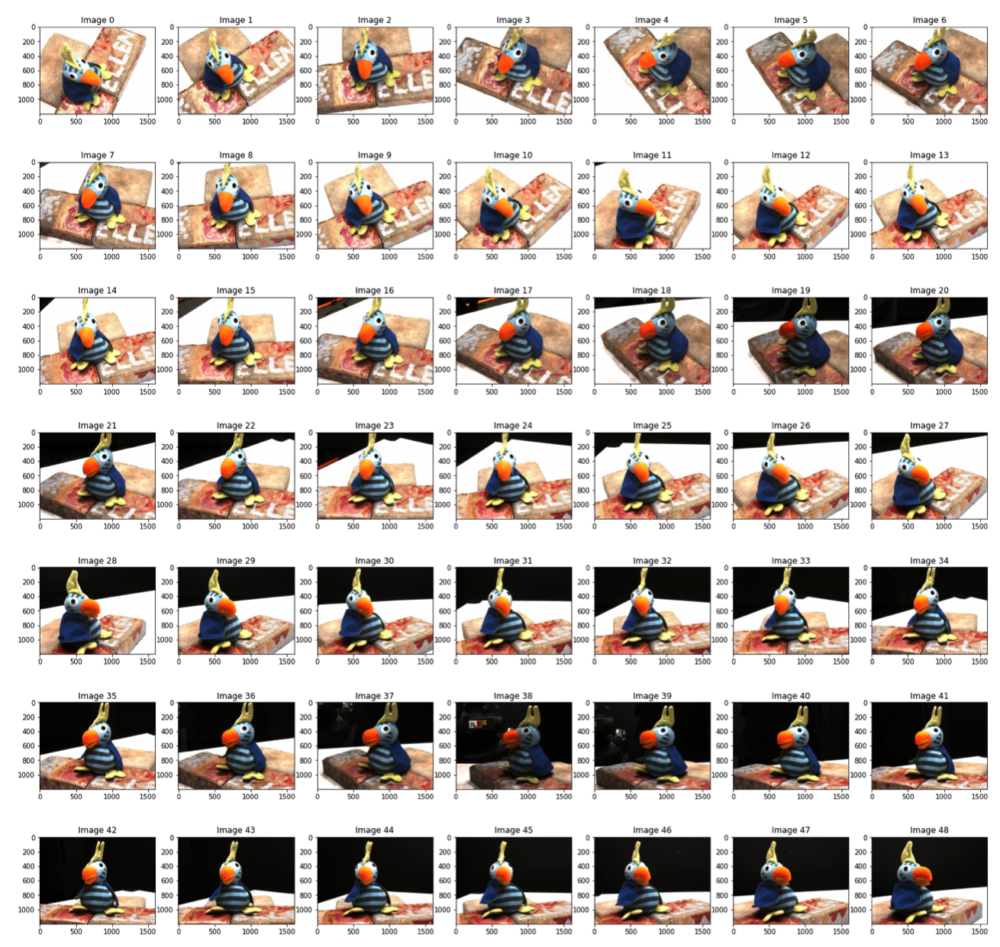

## Identify Points of Interests
The very first step of 3D reconstruction is to identify points of interests in images. In homework we built a Shi-Tomasi corner detector which is able to detect corner points in images. In this approach we use a stronger dectection algorithm called SIFT provided by OpenCV. The basic idea of SIFT is similar to Shi-Tomasi, instead while Shi-Tomasi is rotation-invariant (which means even if the image is rotated we can still find the same corners), SIFT is rotation-invariant and scaling-invariant (even if the image is scaled the same corners can still be found). It also computes rotation-invariant and scaling-invariant feature descriptors for every key points, which we use later for key point matching. For more information, refers to [https://docs.opencv.org/4.5.4/da/df5/tutorial_py_sift_intro.html](https://docs.opencv.org/4.5.4/da/df5/tutorial_py_sift_intro.html). The results of key points detection of the 49 images are as below:

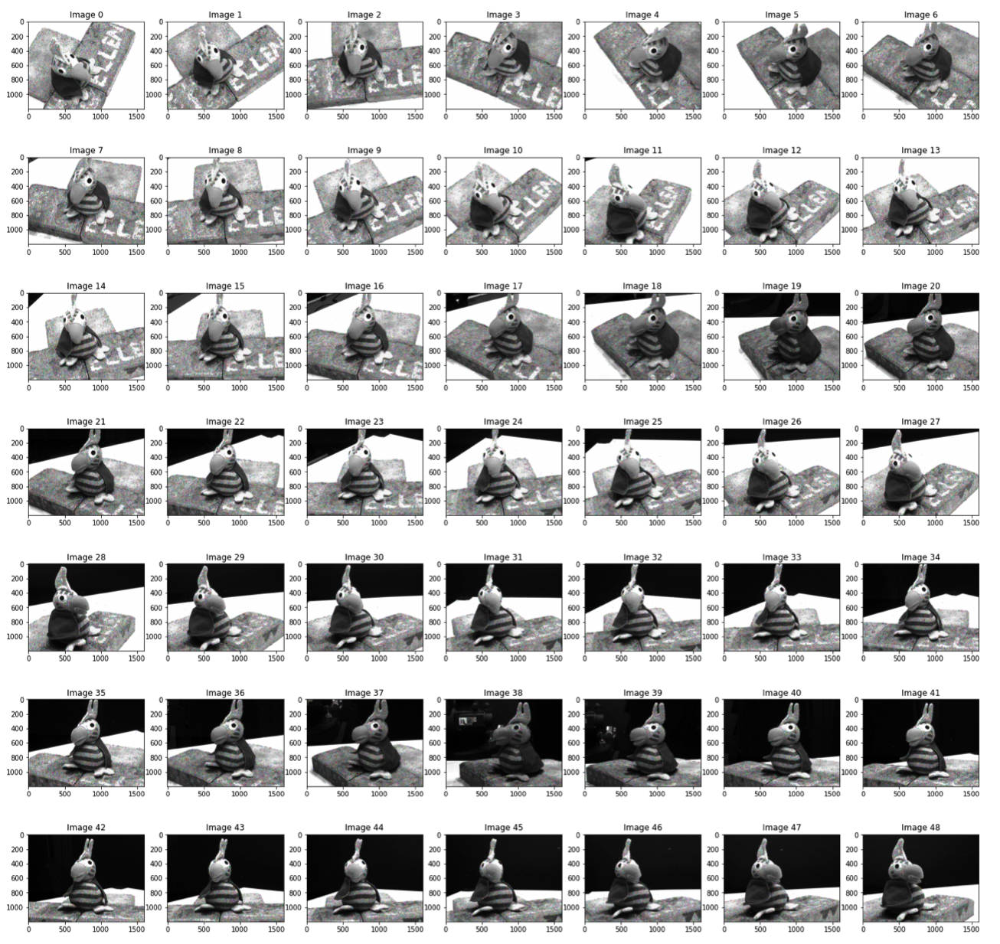

Take a closer look on the detection result of image 0:

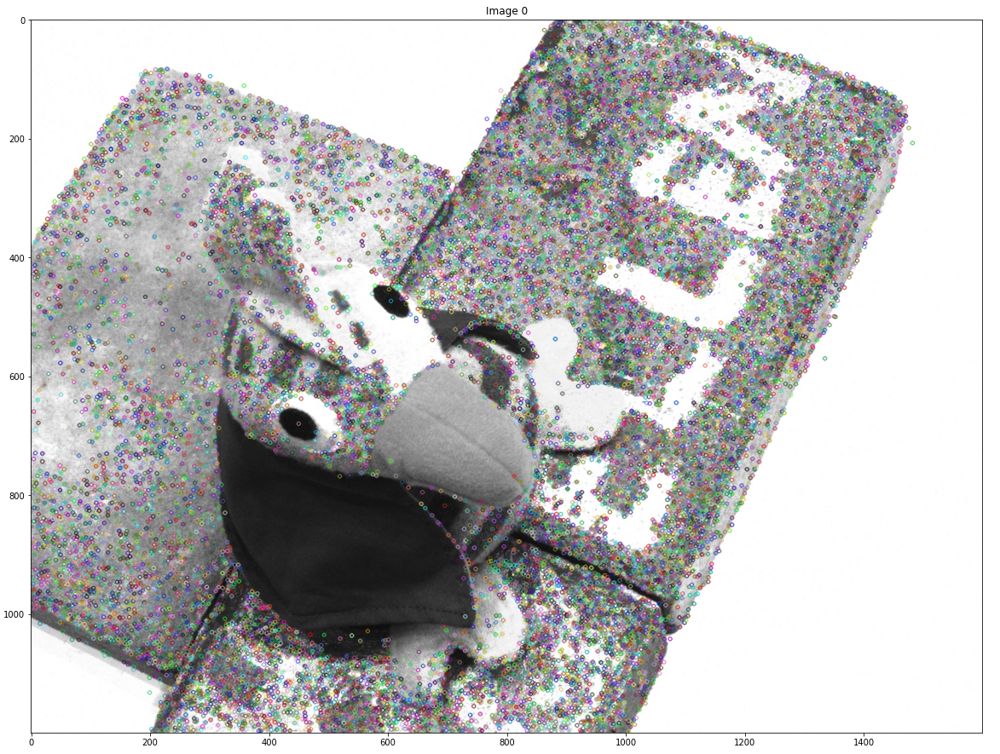

## 3D Reconstruction with Two Cameras

After getting key points of our image set we can formally start to build reconstruction. To begin with, we first build the reconstruction with two images. We want to choose two images from our image set, derive the correspondences between their key points, and do triangulation according to the extrinsic/intrinsic matrices and correspondences to reconstruct 3D points. Since every two neighboring images in our dataset are also photoed by neighboring cameras, we can start with image 0 and image 1. We add images one by one later.

To derive correspondence between two images, we use the feature descriptors extracted by SIFT and match key points by brute-force search. For every key points, we derived two of its closest neighbor in the corresponding image. Then we do a ratio test with threhold 0.6 to clean the corresondence. More specifically, we only preserve points that the distance between itself and its best match is below 0.6 times the distance from itself to its second match. This will help us get a cleaner correspondence. The result of key points matching is as below:

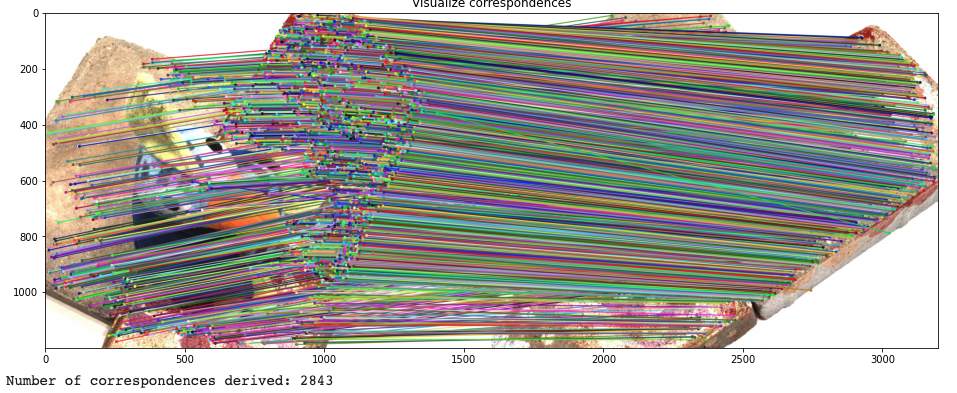

After that, we can use the correspondence to reconstruct 3D points through triangulation. We use `triangulatePoints` in OpenCV library to achieve this. The reconstruction result is as below:

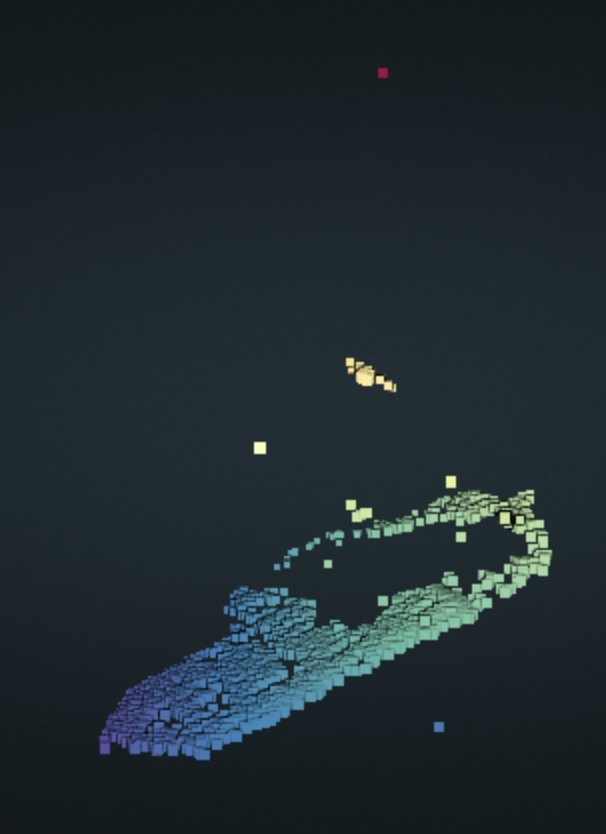

(With parameter 0.6 in ratio test)

## 3D Reconstruction with Multiple Cameras

### Validate Correspondence

Before adding more images into scope, we first validate the correspondence. The plain correspondence we derived above might include some noises. This might not be obvious when we are only building the reconstruction with two images, but as we increase our data set size, the error will accumulate and bring a large number of false correspondence. Therefore, we use fundamental matrix to remove outliers. The formula for calculating fundamental matrix is
$$F = K_1^{-T}([t]_{\times}R)K_2^{-1}$$
where
$$
[t]_{\times} = 
\begin{bmatrix}
0 & -t_3 & t_2 \\
t_3 & 0 & -t_1 \\
-t_2 & t_1 & 0
\end{bmatrix}
$$
With given camera matrices, we are able to get fundamental matrices between every pairs of the images, and then use it to calculate the epipolar line for removing outliers. We do this with a threshold of 0.25, and the cleaned correspondence looks as below:

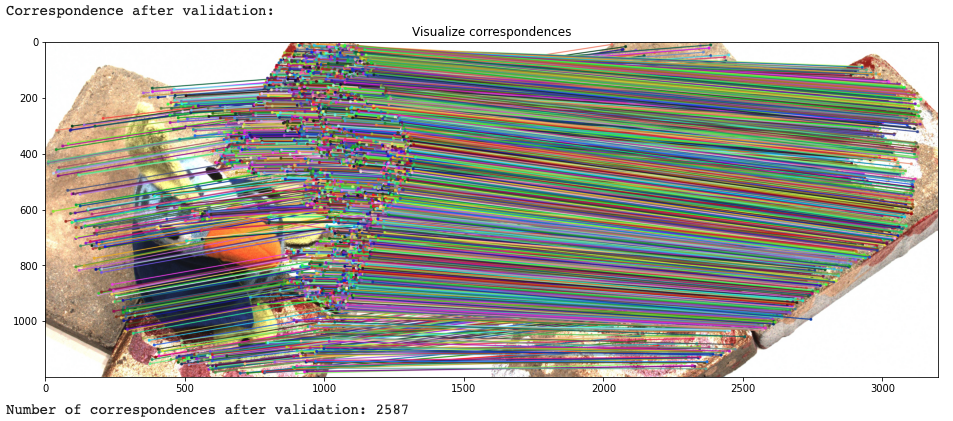

(With a threshold of 25.0 in validating correspondences)

We set a relatively large threshold which only removes a small number of points that are too far away from the ground truth. This is due to the cleaness of our dataset, where correspondence derived by the code above is mostly correct. Using fundamental matrix to remove outliers is basically a trade-off between accuracy and number of points preserved. To preserve as many correct reconstructed points as possible, we use a large threshold here and use some other approaches in the final section to remove outliers. 

### Adding More Cameras

The idea of including more cameras is simple: since every two neighboring images are photoed by neighboring cameras, which means it is possible to get a fair correspondence between every two neighboring images, we can do a sequence of matching-validating-triangulating on every pair of neighboring images (image 0 and 1, 1 and 2, 2 and 3, etc.) and put all of the points we calculated together. Since we have 49 images, which gives us 50 neighboring pairs, we can get much more reconstructed points than only using two images. The final reconstructed result looks as below:

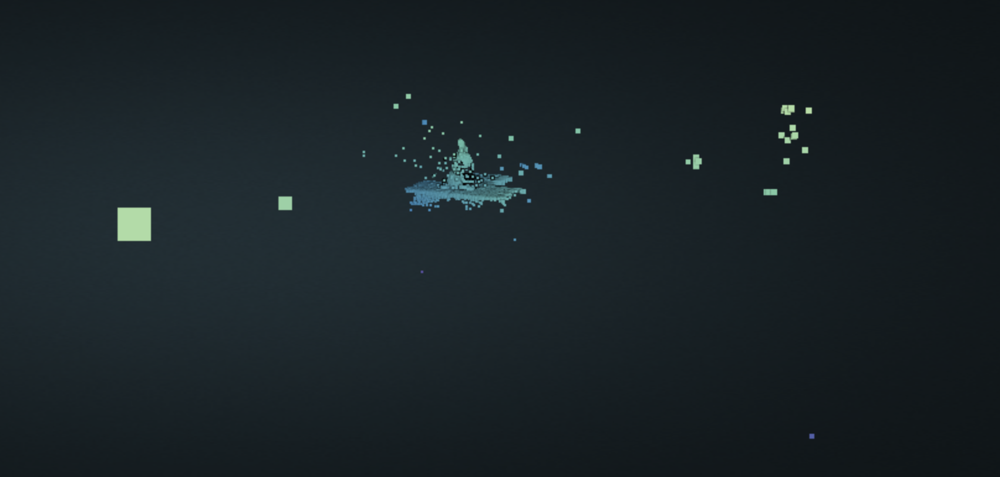

## Outliers Removal

We use `remove_statistical_outlier` from Open3d to remove outliers. The idea of the function is to removes points that are further away from their neighbors compared to the average for the point cloud. The details of the function can be found here: [http://www.open3d.org/docs/release/tutorial/geometry/pointcloud_outlier_removal.html?highlight=remove_statistical_outliers](http://www.open3d.org/docs/release/tutorial/geometry/pointcloud_outlier_removal.html?highlight=remove_statistical_outliers). We do this process twice: the first time is to remove outliers that are obviously deviated from the center, and the second time is a deeper clean on unreliable points. After removing outliers, the final result looks like this:

Final Result

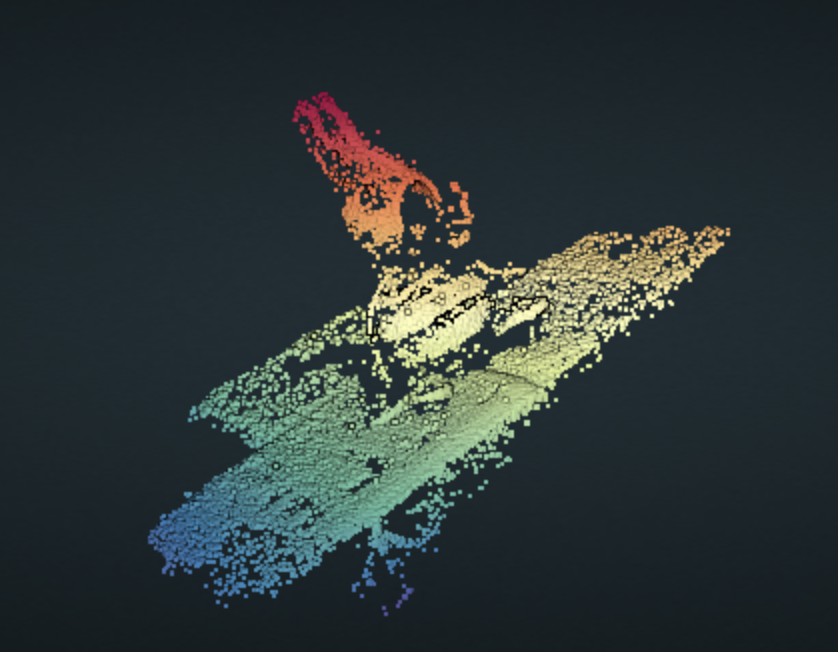

# Limitations

One of the key limitations of this approach is that it's not a "strict" 3D-reconstruction. Because we calculate the 3D points with every pairs of the neighboring images and add all of the calculated points into our point cloud, we almost inevitably calculated some key points more than once. For example, a key point in actual space might be detected in image 1, 2 and 3. As we build correspondence for this actual point across image 1 and 2, we build a reconstructed point for it. However, we might also have built the correspondence for this key point across image 2 and 3, and get another reconstructed point which is close to the point we built with image 1 and 2 due to calculation error. As result, a point in actual space might have several corresponding points in our reconstruction. As we include redundant points, error might accumulate and this might lead to inaccurate results. A straightforward way to improve this is to build correspondence across as many images as possible (not only building correspondence between two images), and then use an optimization approach to make the projection error to all of those detected corresponding points reaches minimal. I didn't implement this approach because as you can see, our reconstruction doesn't suffer from a intolerable inaccuracy. This is due to the cleaness of our dataset, which gives us mostly correct results when we build correspondence with SIFT features. In fact, the major part that can be improved lies at how to get the point cloud denser. We lack some points (like the beak of the bird) in our reconstruction not because we built incorrect correspondence for them, but becuase they are textureless and are barely detected by the key points detector. To improve this, we might have to design some specific key point detectors and features, which I think is beyond the scope of this class, so I'll just keep with the final results I already have.